# Audio

This tutorial demonstrates how to use OpenSoundscape to open, inspect, and modify audio files using the `Audio` class.

The class gives access to modifications such as trimming short clips from longer recordings, splitting a long clip into multiple segments, bandpassing recordings, and extending the length of recordings by looping them.

## Run this tutorial

This tutorial is more than a reference! It's a Jupyter Notebook which you can run and modify on Google Colab or your own computer.

|Link|How to run tutorial|
| :- | :- |
| [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/kitzeslab/opensoundscape/blob/master/docs/tutorials/audio.ipynb) | The link opens the tutorial in Google Colab. Uncomment the "installation" line in the first cell to install OpenSoundscape. |
| [![Download via DownGit](https://img.shields.io/badge/GitHub-Download-teal?logo=github)](https://minhaskamal.github.io/DownGit/#/home?url=https://github.com/kitzeslab/opensoundscape/blob/master/docs/tutorials/audio.ipynb) | The link downloads the tutorial file to your computer. Follow the [Jupyter installation instructions](https://opensoundscape.org/en/latest/installation/jupyter.html), then open the tutorial file in Jupyter. |

In [ ]:
# Uncomment the next line to download OpenSoundscape for use in Google Colab
#!pip install opensoundscape

## Setup

### Import `Audio` class
Import the `Audio` class from OpenSoundscape. 

For more information about Python imports, review [this](https://medium.com/code-85/a-beginners-guide-to-importing-in-python-bb3adbbacc2b) article.

In [1]:
# Import Audio class from OpenSoundscape
from opensoundscape import Audio

### Get an example audio file

Here we download an example birdsong soundscape recorded by an AudioMoth autonomous recorder in Pennsylvania, USA.

In [2]:
import subprocess
_ = subprocess.run(['curl',
               'https://drive.google.com/uc?export=download&id=1hBUyhgPf-vxeet8BITSMZ0XsGiU-a7SG', 
                '-sLo' '1min_audio.wav'])

To use your own file for the following examples, download this tutorial and change the string assigned to `audio_filename` to the path of any audio file on your computer. 

In [3]:
audio_filename = './1min_audio.wav'

## Load audio

The process for loading audio depends on the file type.

### Load from .wav:

In [4]:
audio_object = Audio.from_file(audio_filename)
audio_object

<Audio(samples=(1920000,), sample_rate=32000)>

The interactive playback widget is displayed when an Audio object is returned from a notebook cell. We can also create the widget with `.show_widget()`:

In [5]:
# Create playback widget with normalized playback level
audio_object.show_widget(normalize=True)

### Load other file types

Loading `.mp3` files is possible in OpenSoundscape, but you have to install [FFmpeg](https://www.ffmpeg.org/) first. However, `.mp3` files have reduced performance in some cases (e.g. loading a segment from a file is slower), so we recommend using `.wav` files.

Currently, OpenSoundscape does not support loading `.flac` files. 

For the best performance, we recommend using FFmpeg to convert `.mp3` and `.flac` files to `.wav` before using them in OpenSoundscape.

### Load a segment of a file
We can directly load a section of a `.wav` file very quickly (even if the audio file is large) using the `offset` and `duration` parameters.

For example, let's load 1 second of audio from 2.0-3.0 seconds after the start of the file:

In [6]:
audio_segment = Audio.from_file(
    audio_filename,
    offset=2.0,
    duration=1.0)
audio_segment.duration
audio_segment.show_widget()

### Resample audio during load

By default, an audio object is loaded with the same sample rate as the source recording. 

The `sample_rate` parameter of `Audio.from_file` allows you to re-sample the file during the creation of the object. This is useful when working with multiple files to ensure that all files have a consistent sampling rate.

Let's load the same audio file as above, but specify a sampling rate of 22050 Hz.

In [7]:
audio_object_resample = Audio.from_file(audio_filename, sample_rate=22050)
audio_object_resample.sample_rate

22050

### Load audio from a real-world time from AudioMoth recordings
OpenSoundscape parses metadata of files recorded on AudioMoth recorders, and can use the metadata to extract pieces of audio corresponding to specific real-world times. (Note that AudioMoth internal clocks can drift an estimated 10-60 seconds per month). 

In [8]:
from datetime import datetime; import pytz

start_time = pytz.timezone('UTC').localize(datetime(2020,4,4,10,25))
audio_length = 5 #seconds  
path = '/path/to/audiomoth_recording.WAV' #an AudioMoth recording

# This line is commented because it will fail unless you specify a valid path in the line above
# Audio.from_file(path, start_timestamp=start_time,duration=audio_length)

## Audio properties

Once an `Audio` object is loaded, you can inspect its attributes, including:
* **Samples**: The actual digitized audio data
* **Sample rate**: The number of audio samples taken per second, required to understand the samples
* **Duration**: The length of the recording, calculated by dividing the number of samples by the sample rate
* **RMS (root mean square)**: The average amplitude of the digitized sound wave
* **dBFS (decibels relative to full scale)**: A general measure of "loudness" of a recording. Decibels are measured on a scale less than 0, with values closer to 0 being louder. An decrease in 6 decibels is equivalent to the sound being twice as far away.


In [9]:
print(f"First few samples: {audio_object.samples[:3]}")
print(f"Number of samples: {len(audio_object.samples)}")
print(f"Sample rate: {audio_object.sample_rate}")
print(f"Duration: {audio_object.duration}")
print(f"RMS: {audio_object.rms:0.3f}")
print(f"dBFS: {audio_object.dBFS:0.1f}")

First few samples: [-0.00888062 -0.00344849  0.00378418]
Number of samples: 1920000
Sample rate: 32000
Duration: 60.0
RMS: 0.013
dBFS: -34.5


## Modify audio

The `Audio` class gives access to a variety of tools to change audio files, load them with special properties, or get information about them. Various examples are shown below.

For a description of the entire `Audio` object API, see the [API documentation](../api/modules.html#module-opensoundscape.audio).

**NOTE: Out-of-place operations**

Functions that modify `Audio` (and `Spectrogram`) objects are "out of place", meaning that they return a new, modified instance of `Audio` instead of modifying the original instance. This means that running a line
```
audio_object.resample(22050) # WRONG!
```
will **not** change the sample rate of `audio_object`! If your goal was to overwrite `audio_object` with the new, resampled audio, you would instead write
```
audio_object = audio_object.resample(22050)
```


### Trim audio

The `.trim()` method extracts audio from a specified time period in seconds (relative to the start of the audio object).

In [10]:
trimmed = audio_object.trim(0,5)
trimmed.duration

5.0

### Split Audio into clips
The `.split()` method divides audio into even-lengthed clips, optionally with overlap between adjacent clips (default is no overlap). See the function's documentation for options on how to handle the last clip.

The function returns a list containing Audio objects for each clip and a DataFrame giving the start and end times of each clip with respect to the original file. 

#### Split without overlap

Split the audio into non-overlapping (mutually exclusive) clips

In [11]:
# Split into 5-second clips with no overlap between adjacent clips
clips, clip_df = audio_object.split(clip_duration=5,clip_overlap=0,final_clip=None)

# Check the duration of the Audio object in the first returned element
print(f"duration of first clip: {clips[0].duration}")

print(f"head of clip_df")
clip_df.head(3)

duration of first clip: 5.0
head of clip_df


,start_time,end_time
0,0.0,5.0
1,5.0,10.0
2,10.0,15.0


#### Split with overlap

Split the audio into overlapping clips.

Note that a negative "overlap" value would leave _gaps_ between consecutive clips. 

In [12]:
_, clip_df = audio_object.split(clip_duration=5,clip_overlap=2.5,final_clip=None)
print(f"head of clip_df")
clip_df.head()

head of clip_df


,start_time,end_time
0,0.0,5.0
1,2.5,7.5
2,5.0,10.0
3,7.5,12.5
4,10.0,15.0


#### Split and save 
The `Audio.split_and_save()` method splits audio into clips and immediately saves them to files in a specified location. 

You provide it with a naming prefix, and it will add on a suffix indicating the start and end times of the clip (eg `_5.0-10.0s.wav`). It returns just a DataFrame with the paths and start/end times for each clip (it does not return Audio objects). 

The splitting options are the same as `.split()`: `clip_duration`, `clip_overlap`, and `final_clip`.

**NOTE: If you want to split clips for use as a machine learning training dataset, you do not need to pre-split clips. See the machine learning tutorials for more information.**

In [13]:
# Split into 5-second clips with no overlap between adjacent clips
from pathlib import Path
Path('./temp_audio').mkdir(exist_ok=True)
clip_df = audio_object.split_and_save(
    destination='./temp_audio',
    prefix='audio_clip_',
    clip_duration=5,
    clip_overlap=0,
    final_clip=None
)

print(f"head of clip_df")
clip_df.head()

head of clip_df


,start_time,end_time
file,,
./temp_audio/audio_clip__0.0s_5.0s.wav,0.0,5.0
./temp_audio/audio_clip__5.0s_10.0s.wav,5.0,10.0
./temp_audio/audio_clip__10.0s_15.0s.wav,10.0,15.0
./temp_audio/audio_clip__15.0s_20.0s.wav,15.0,20.0
./temp_audio/audio_clip__20.0s_25.0s.wav,20.0,25.0


The folder `temp_audio` should now contain 12 5-second clips created from the 60-second audio file. 

Clean up: delete temp folder of saved audio clips

In [14]:
from shutil import rmtree
rmtree('./temp_audio')

#### Split and save "dry run"
we can use the `dry_run=True` option to produce only the clip_df but not actually process the audio. this is useful as a quick test to see if the function is behaving as expected, before doing any (potentially slow) splitting on huge audio files. 

Just for fun, we'll use an overlap of -5 in this example (5 second gap between each consecutive clip)

This function returns a DataFrame of clips, but does not actually process the audio files or write any new files. 

In [15]:
clip_df = audio_object.split_and_save(
    destination='./temp_audio',
    prefix='audio_clip_',
    clip_duration=5,
    clip_overlap=-5,
    final_clip=None,
    dry_run=True,
)
clip_df

,start_time,end_time
file,,
./temp_audio/audio_clip__0.0s_5.0s.wav,0.0,5.0
./temp_audio/audio_clip__10.0s_15.0s.wav,10.0,15.0
./temp_audio/audio_clip__20.0s_25.0s.wav,20.0,25.0
./temp_audio/audio_clip__30.0s_35.0s.wav,30.0,35.0
./temp_audio/audio_clip__40.0s_45.0s.wav,40.0,45.0
./temp_audio/audio_clip__50.0s_55.0s.wav,50.0,55.0


### Extend and loop

The `.extend_to()` method extends an audio file to a desired length by adding silence to the end.

The `.loop()` method extends an audio file to a desired length (or number of repetitions) by looping the audio. 

Duration of original clip: 5.0
Duration of extended clip: 10.0
Samples of extended clip:


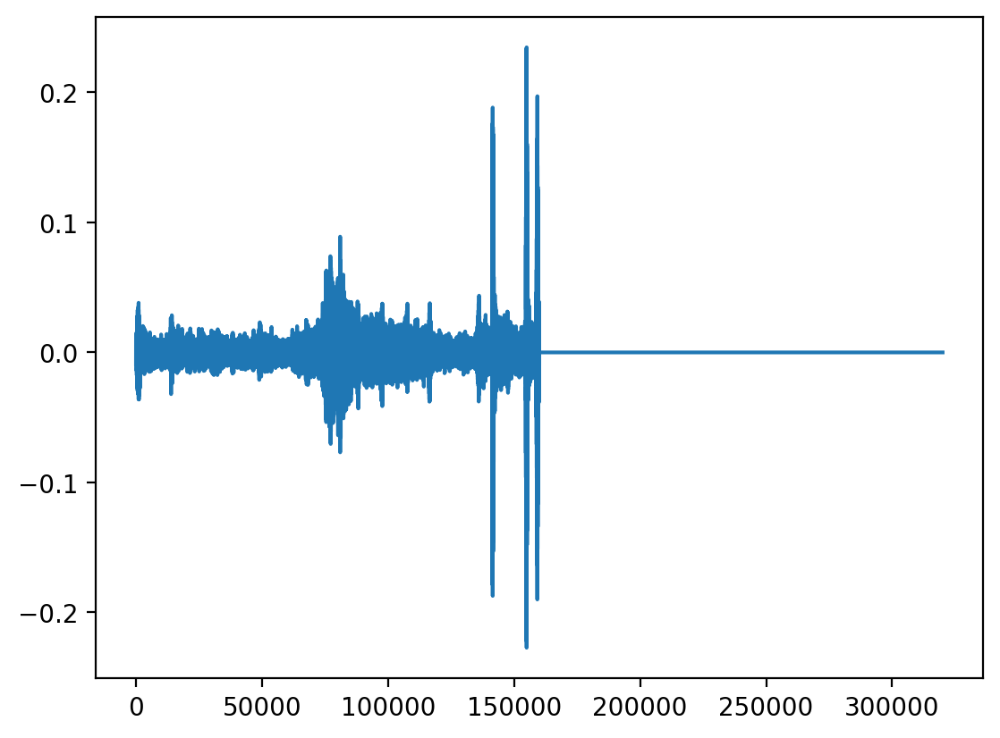

In [16]:
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

# create an audio object twice as long, extending the end with silence (zero-values)
extended = trimmed.extend_to(trimmed.duration * 2)

print(f"Duration of original clip: {trimmed.duration}")
print(f"Duration of extended clip: {extended.duration}")
print(f"Samples of extended clip:")
plt.plot(extended.samples)
plt.show()

Duration of looped clip: 7.5
Samples of looped clip:


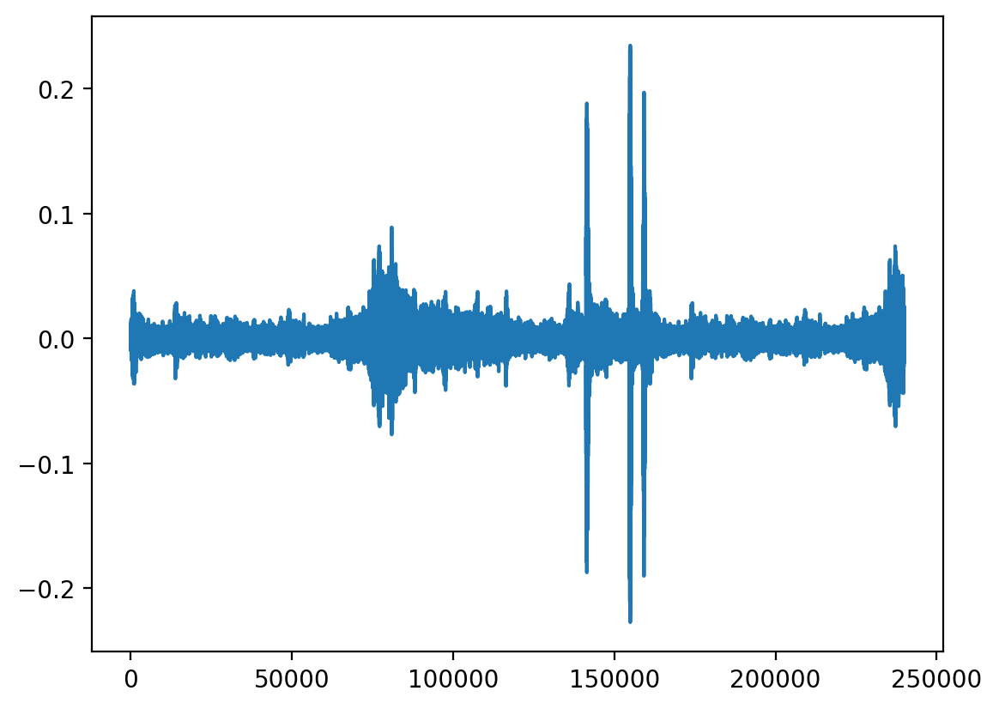

In [17]:
looped = trimmed.loop(trimmed.duration * 1.5)
print("Duration of looped clip:", looped.duration)
print("Samples of looped clip:")
plt.plot(looped.samples)
plt.show()

### Resample audio

The `.resample()` method resamples the audio object to a new sampling rate. This can be lower or higher than the original sampling rate.

Keep in mind that resampling can also be done while loading the file.

In [18]:
resampled = trimmed.resample(sample_rate=48000)
resampled.sample_rate

48000

Note that resampling audio to a lower rate reduces the sound frequencies that can be captured in the audio. The highest frequency that an audio file can capture is half of the sampling rate.

### Generate a frequency spectrum
The `.spectrum()` method provides an easy way to compute a Fourier Transform on an audio object to measure its frequency composition. 

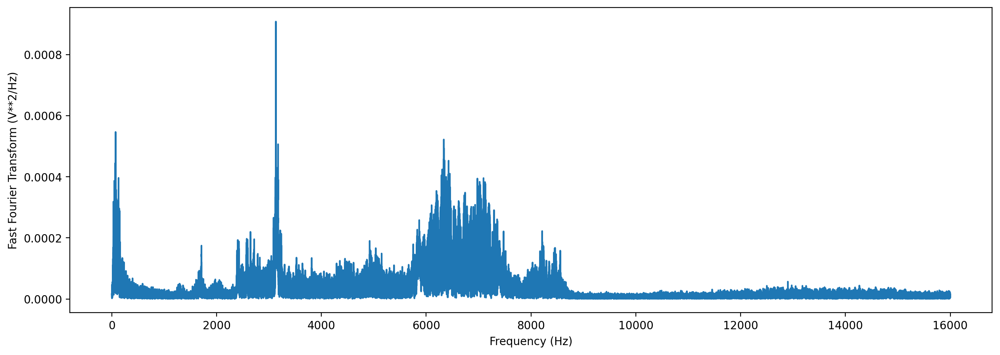

In [19]:
# Calculate the fft
fft_spectrum, frequencies = trimmed.spectrum()

# Plot settings
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize']=[15,5] #for big visuals
%config InlineBackend.figure_format = 'retina'

# Plot
plt.plot(frequencies,fft_spectrum)
plt.ylabel('Fast Fourier Transform (V**2/Hz)')
plt.xlabel('Frequency (Hz)')
plt.show()

### Bandpass
Bandpass the audio file to limit its frequency range to 1000 Hz to 5000 Hz. The bandpass operation uses a Butterworth filter with a user-provided order.

Spectrum after bandpassing the audio:


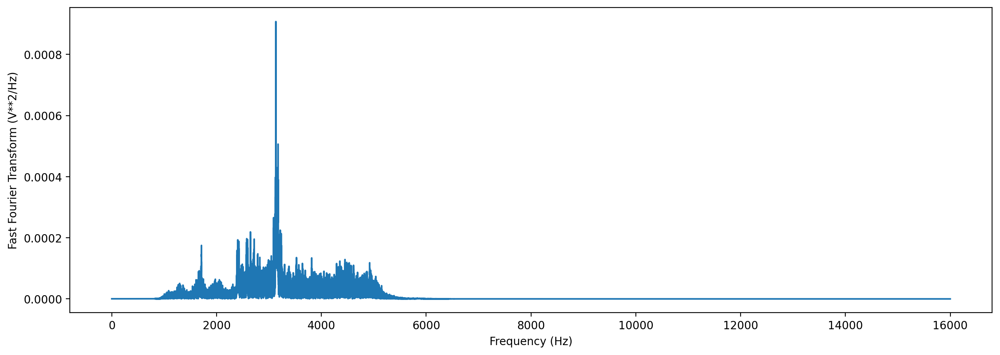

In [20]:
# Apply a bandpass filter
bandpassed = trimmed.bandpass(low_f = 1000, high_f = 5000, order=9)

# Calculate the bandpassed audio's spectrum
fft_spectrum, frequencies = bandpassed.spectrum()

# Plot
print('Spectrum after bandpassing the audio:')
plt.plot(frequencies,fft_spectrum)
plt.ylabel('Fast Fourier Transform (V**2/Hz)')
plt.xlabel('Frequency (Hz)')
plt.show()

## Save audio to file

Opensoundscape currently supports saving Audio objects to `.wav` formats **only**. It does **not** currently support saving metadata (tags) along with wav files - only the samples and sample rate will be preserved in the file. 

In [21]:
audio_object.save('./my_audio.wav')

Clean up: delete original file and saved file 

In [22]:
Path('./my_audio.wav').unlink()

In [23]:
Path('./1min_audio.wav').unlink()